# Selection Trends (Linkage Decay - Binned Average)

## Introduction

This notebook will describe the analysis of possible selection trends through visualizing the linkage decay found at gene regiosn of interest. This notebook will make use of the python graphing library [Plotly](https://plotly.com/python/) which gives us a set of facilities (functions, objects and methods) for programatic graph construction and rendering in python. This notebook will make use of data obtained for [Publication]() as part of said work. To render a Linkage-Decay plot, we will need to have generated a Linkage-Decay report:

1. Import the relevant data required, which is a Linkage-Disequilibrium report generated using Plink-2.0.
1. render the graph

> This library offers two main frameworks for graph construction in python. an object-oriented approact and a function driven approach. This design difference allows the freedom to graph data in both [long- and wide-format](https://libguides.princeton.edu/R-reshape). For the purposes of this notebook, we will be making use of `plotly.graph_objects`, the object-based, long data format approach. This is so that we can make use of the `make_subplots` function to create multiple graphs in a single figure, which requires the use of traces-system from `plotly.graph_objects`.





###  Objectives
- To plot a linkage-decay plot (Linkage Disequilibrium over distance)
    - implement quartile-based spline trendline fitting

## Linkage Decay calculation

This notebook will make use of linakge disequilibrium data generated using [Plink-2](https://www.cog-genomics.org/plink/2.0/)'s [`--r[2]-[un]phased`](https://www.cog-genomics.org/plink/2.0/ld#r) command. This command produces a [`.vcor`](https://www.cog-genomics.org/plink/2.0/formats#vcor) file containing pair-wise SNP comparisons and associated Linakge Disequilibrium scores.


> For this notebook, the following command was run from the `reportLinkageDisequilibriumPartitionedPerClusterPerLocation` `checkpoint`:
> ```bash
> plink2 --threads {threads} --pfile {params.input} vzs --loop-cats {wildcards.cluster} --ld-window 100 --r2-unphased yes-really zs cols=chrom,pos,id,ref,alt,provref,maj --out {params.output} >{log} 2>&1
> ```

## Imports

For this notebook, we will be graphing 

In [6]:
from os.path import join
from pandas import read_csv, concat, cut, DataFrame, Series, qcut
import seaborn as sns
from scipy.interpolate import splrep, BSpline
from pathlib import Path
from json import load

In [7]:
with open(join("config", "manifest.json"), 'r') as config:
    config = load(config)

path = join(*config["output"])

In [8]:
SAMPLES = read_csv(join("input", "samples.csv"))
LOCATIONS = read_csv(join("input", "locations.csv"))
DATASETS = read_csv(join("input", "datasets.csv"))
POPULATIONS_TO_COMPARE = SAMPLES["super-population"].unique().tolist()
MULTIINDEX = ["CHROM", "POS", "ID", "REF", "ALT"]

Next, we will need to import our datasets (These will be stored as the variable `DATA`).

In [9]:
def binData(data: Series, bin_size: int = 500) -> list:
    """Function takes a pandas `Series` and generates a categorical bin annotation suotablel for aggregation, E.g. `.groupby()`.

    Args:
        data (Series): A `Series` conatining  numerical data to be binned.
        bin_size (int, optional): The size of the bins to be made. Defaults to 500.

    Returns:
        Series: The resulting values in a `Series` object.
    """
    _nearest_multiple_of_bin_size = (round(data.max() / bin_size)) * bin_size

    if (data.max() % bin_size) > 0:
        _nearest_multiple_of_bin_size += bin_size

    _list_of_bins = range(0, _nearest_multiple_of_bin_size + bin_size, bin_size)
    _list_of_labels = range(0, _nearest_multiple_of_bin_size, bin_size) # Must be one less than the bins

    return cut(
           data, bins=_list_of_bins, labels=_list_of_labels
        ).to_list()

## Data import and pre-processing

To make a Linkage-decay plot, we will need to import and pre-process all of our Linkage-Disequilibrium reports. As part of this process, I would like to remove any variants which have a missing-call rate exeeding a certain threshold. Thankfully, a column containing this information is already pre-calculated and available in the consolidated datasets produced by the `consolidateReports` rule.


In [10]:
# Create a a new dictionary to store data in.
DATA = dict()


for gene in LOCATIONS["location_name"].unique().tolist():
    # Create a dictionary record for the gene location being processed
    DATA[gene] = dict()

    # Import the consolidated report produced by the workflow for this gene region
    DATA_MISSINGNESS_CONSOLIDATED = read_csv(
        join(
            path,
            "consolidated_reports",
            f"super-population_{gene}.csv",
        )
    )

    # Set a multi-index containing the VCF specifications first five columns (CHR,POS,ID,REF,ALT)
    DATA_MISSINGNESS_CONSOLIDATED.set_index(MULTIINDEX, inplace=True)

    # For each sub-population in this cluster of populations
    for population in POPULATIONS_TO_COMPARE:

        # Import the linkage disequilibrium report for this gene and sub-population
        DATA[gene][population] = read_csv(
            join(
               path,
                "linkage_disequilibrium",
                "super-population",
                gene,
                f"calculated_linkage_disequilibrium_per_cluster.{population}.vcor.zst",
            ),
            header=0,
            sep="\t",
        )
        print(f"{gene} - {population} | {DATA[gene][population].shape[0]} LD comparisons imported")

        # Rename the first column. Plink2 prefixes the first column with a hash-tag
        DATA[gene][population].rename(columns={"#CHROM_A": "CHROM_A"}, inplace=True)

KeyError: "None of ['CHROM', 'POS', 'ID', 'REF', 'ALT'] are in the columns"

In [15]:

for gene in LOCATIONS["location_name"].unique().tolist():
    
    # For each sub-population in this cluster of populations
    for population in POPULATIONS_TO_COMPARE:
        
        # Calculate the distance between the two SNPs being compared and save as a column.
        DATA[gene][population]["Distance"] = abs(
            DATA[gene][population]["POS_B"] - DATA[gene][population]["POS_A"]
        )

        # Generate binned distance
        DATA[gene][population]["Distance (Binned)"] = binData(DATA[gene][population]["Distance"])

        # Here we calculate percentile rankings absed on the R^2 values which will be used 
        # later on to calculate splines for each quantile per population.
        DATA[gene][population]["Quantile"] = qcut(
            DATA[gene][population]["UNPHASED_R2"],
            4,
            duplicates="drop",
        )

        # Drop these unneeded columns
        DATA[gene][population].drop(
            columns=[
                "CHROM_A",
                "POS_A",
                "CHROM_B",
                "POS_B",
                "ID_A",
                "ID_B",
                "REF_A",
                "REF_B",
                "ALT_A",
                "ALT_B",
                "PROVISIONAL_REF_A?",
                "MAJ_A",
                "PROVISIONAL_REF_B?",
                "MAJ_B",
            ],

            inplace=True,
        )

        # Replace the dataframe with a `groupby()` aggregate `mean()` calculation
        DATA[gene][population] = (
            DATA[gene][population].groupby(["Distance (Binned)", "Quantile"], observed=True).mean().reset_index()
        )
        
        
        # Here, we assign a categorical label for this batch of linkage results.
        # This will be needed later for graphing when we combine all our reports together.
        DATA[gene][population]["Population"] = population

## Graphing

Now, we will need to graph this data. To do this, we can make use of the [Plotly (Python) library](https://plotly.com/python/), . This is offered as an open-source facility.

They provide a facility to construct a line graph using the `line` function from the `plotly.express` sub-module



In [16]:
# Concatenate our data to form a wide-dataset ideal for graphing
PLOT_DATA = dict()

# For each gene in our list of genes to study...
for gene in DATA.keys():
    # Create a list to store each set of population-level LD results
    CONCAT_LIST = list()

    # Create a blank DataFrame to store the result in
    PLOT_DATA[gene] = DataFrame()

    # For each population in our list of populations for comparison that were successfully imported
    for population in DATA[gene].keys():
        # Add this populations LD report to the list
        CONCAT_LIST.append(DATA[gene][population])
    
    # Concatenate the list of population-level LD reports for this gene together
    PLOT_DATA[gene] = concat(CONCAT_LIST)

CYP2B6 AFR
CYP2B6 EUR
CYP2B6 EAS
CYP2B6 AMR
CYP2B6 SAS
CYP2B6 CSA
CYP2B6 OCE
CYP2B6 UAE
M > K check:  2000 5 True
M > K check:  2000 5 True
M > K check:  2000 5 True
M > K check:  2000 5 True
Unable to fit a spline. 0 CYP2B6 AFR True (0.199, 0.304]
Unable to fit a spline. 0 CYP2B6 AFR True (0.304, 0.499]
Unable to fit a spline. 0 CYP2B6 AFR True (0.499, 0.878]
Unable to fit a spline. 0 CYP2B6 AFR True (0.878, 1.0]
Unable to fit a spline. 0 CYP2B6 AFR True (0.199, 0.332]
Unable to fit a spline. 0 CYP2B6 AFR True (0.332, 0.552]
Unable to fit a spline. 0 CYP2B6 AFR True (0.552, 0.882]
Unable to fit a spline. 0 CYP2B6 AFR True (0.882, 1.0]
Unable to fit a spline. 0 CYP2B6 AFR True (0.199, 0.269]
Unable to fit a spline. 0 CYP2B6 AFR True (0.269, 0.395]
Unable to fit a spline. 0 CYP2B6 AFR True (0.395, 0.721]
Unable to fit a spline. 0 CYP2B6 AFR True (0.721, 1.0]
Unable to fit a spline. 0 CYP2B6 AFR True (0.199, 0.309]
Unable to fit a spline. 0 CYP2B6 AFR True (0.309, 0.529]
Unable to fit a 

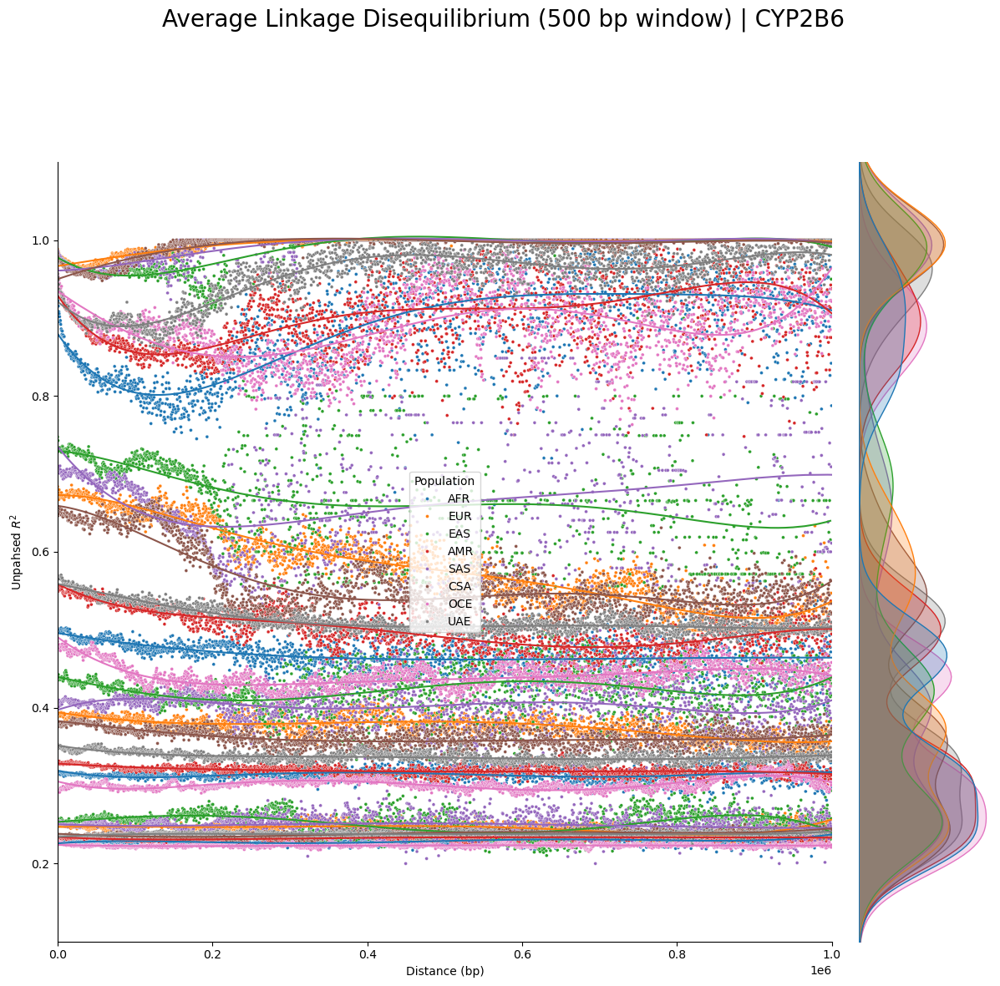

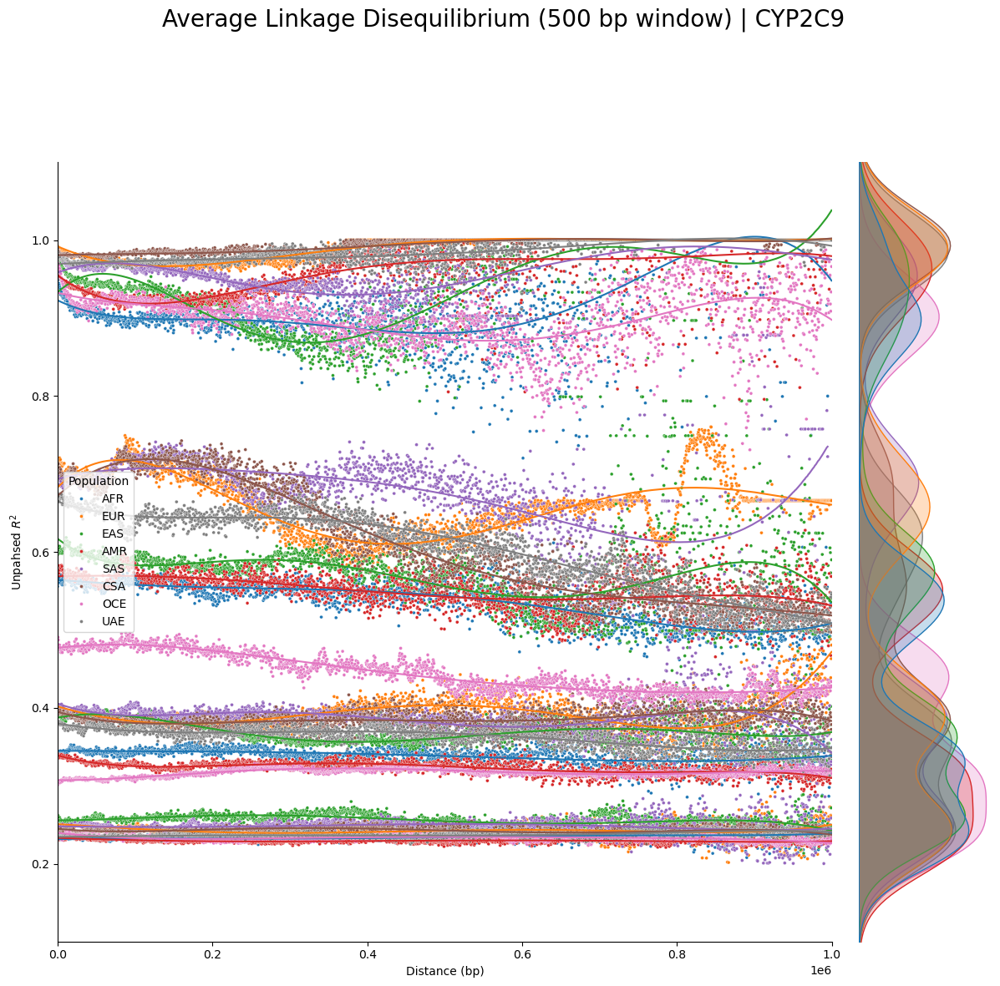

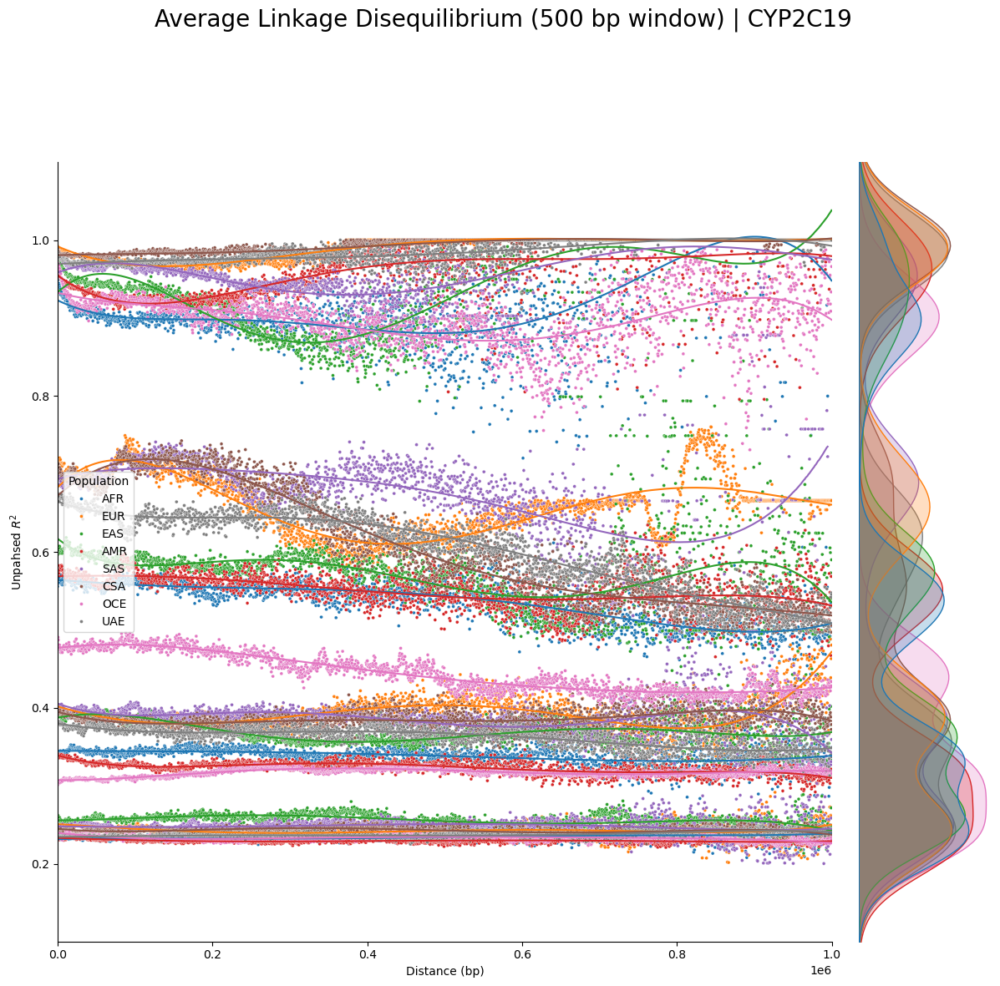

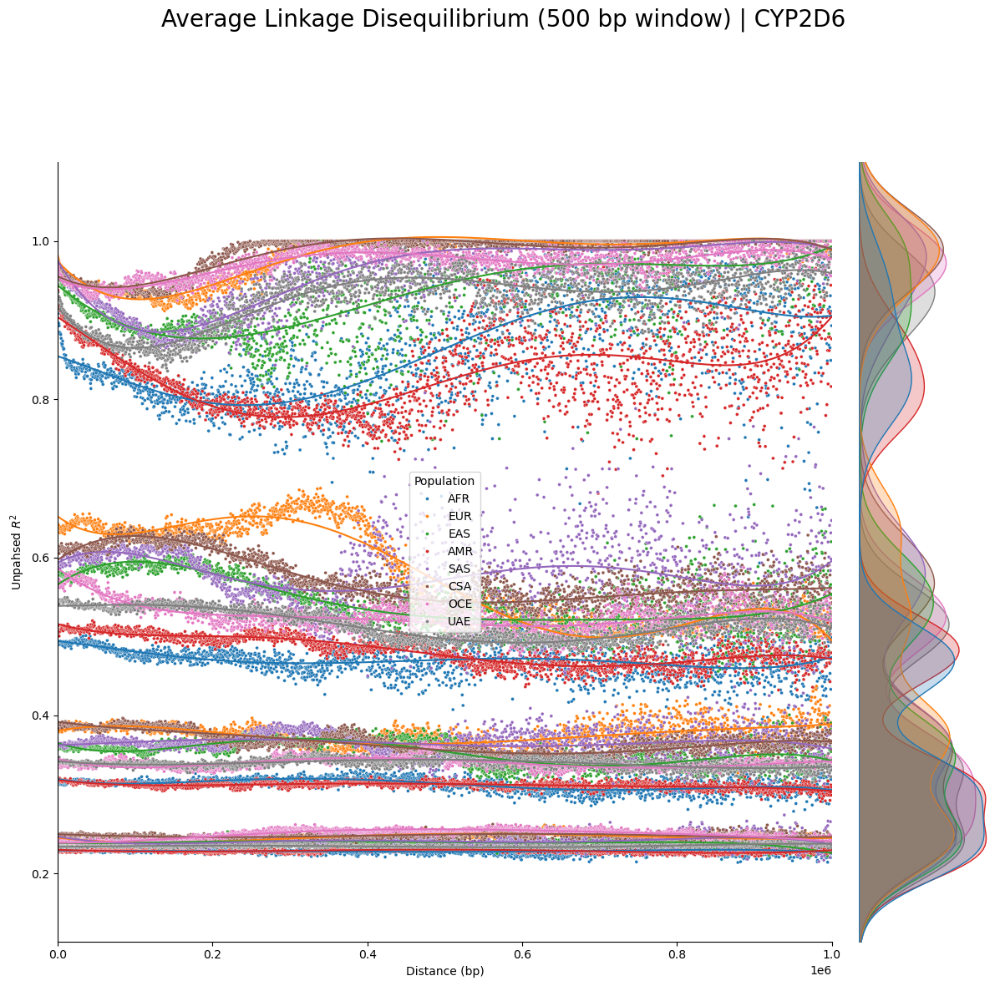

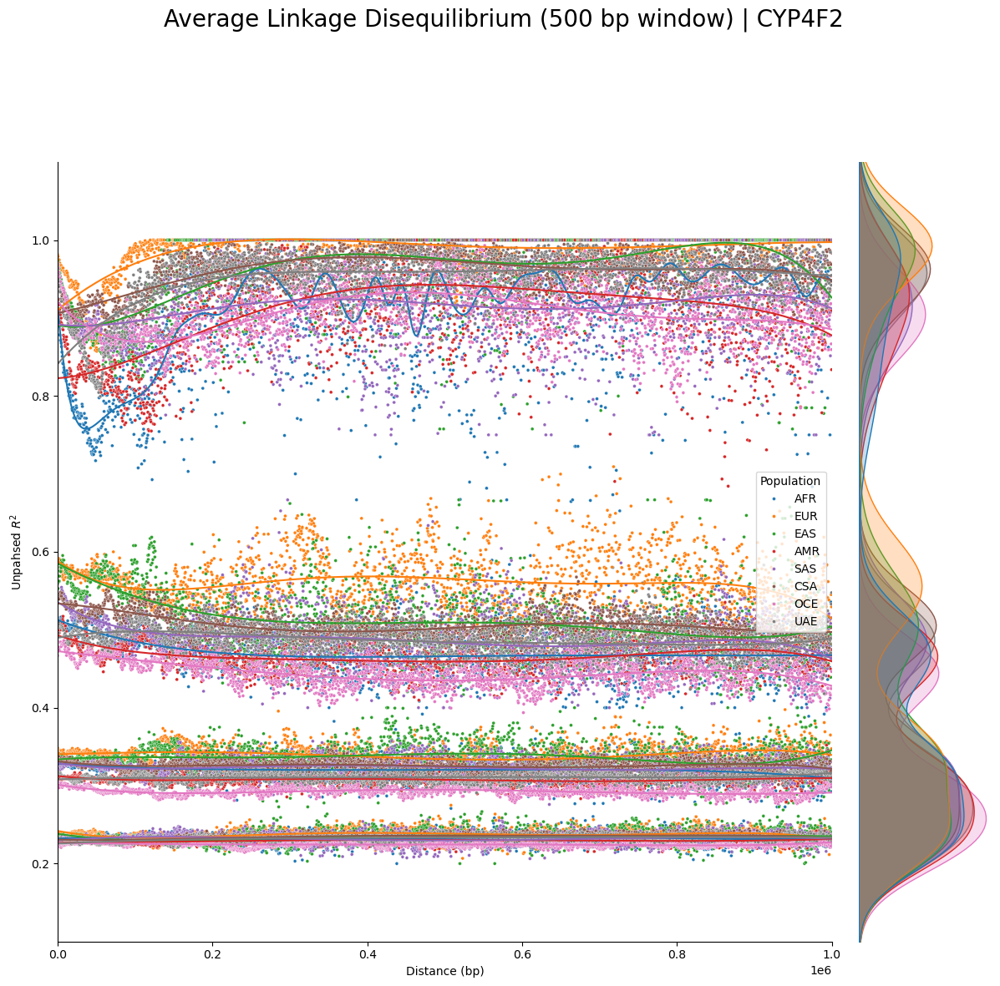

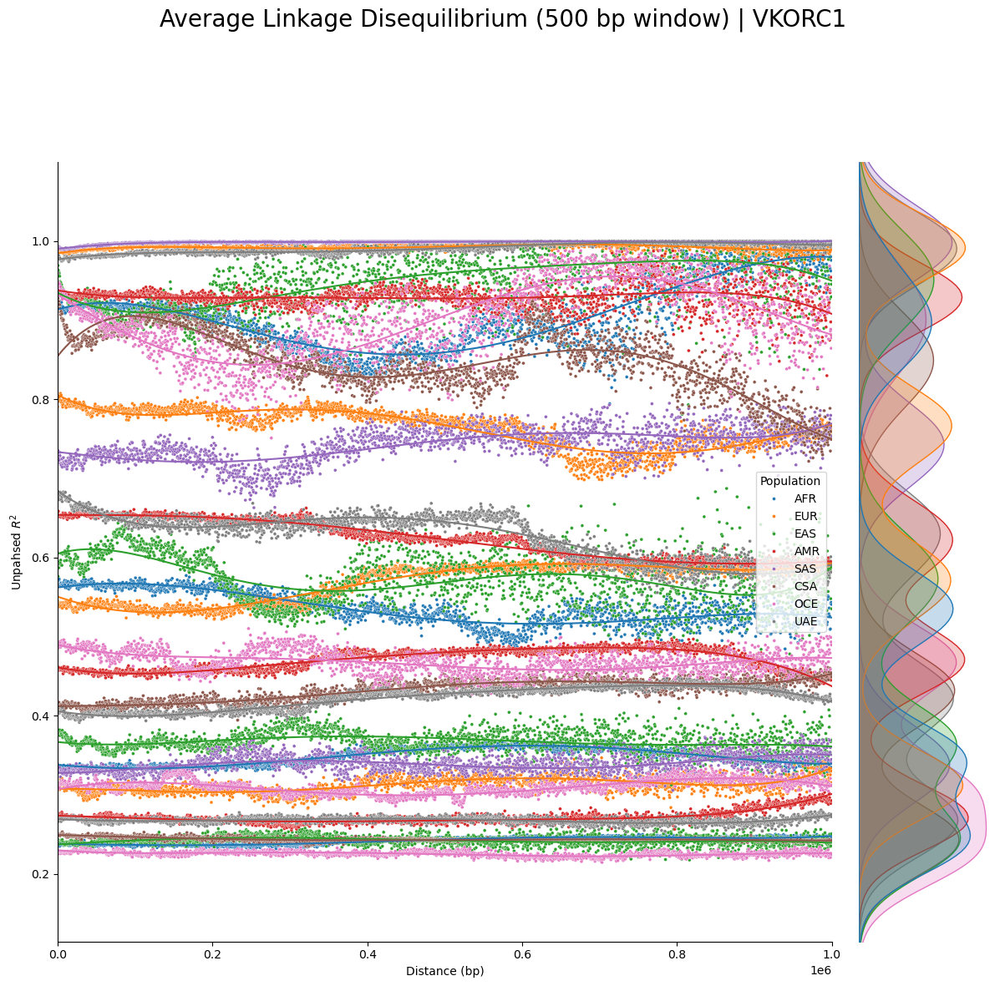

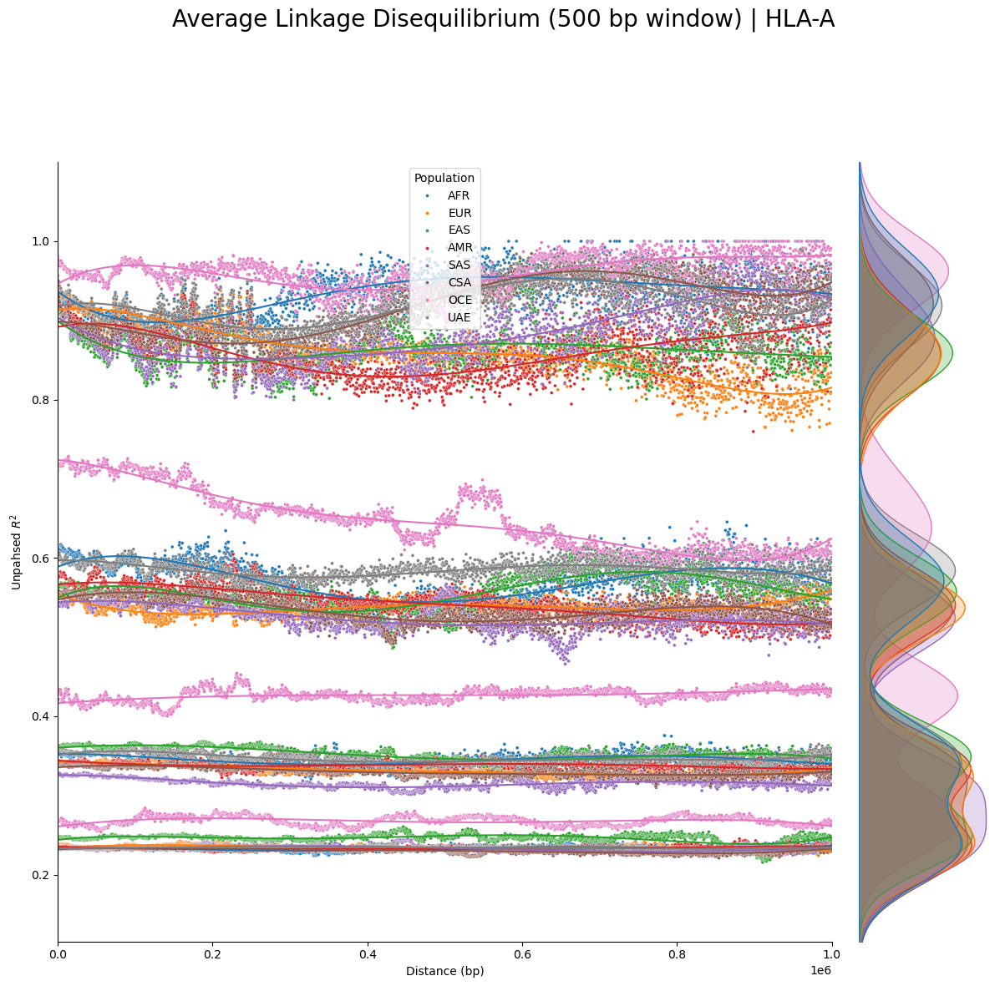

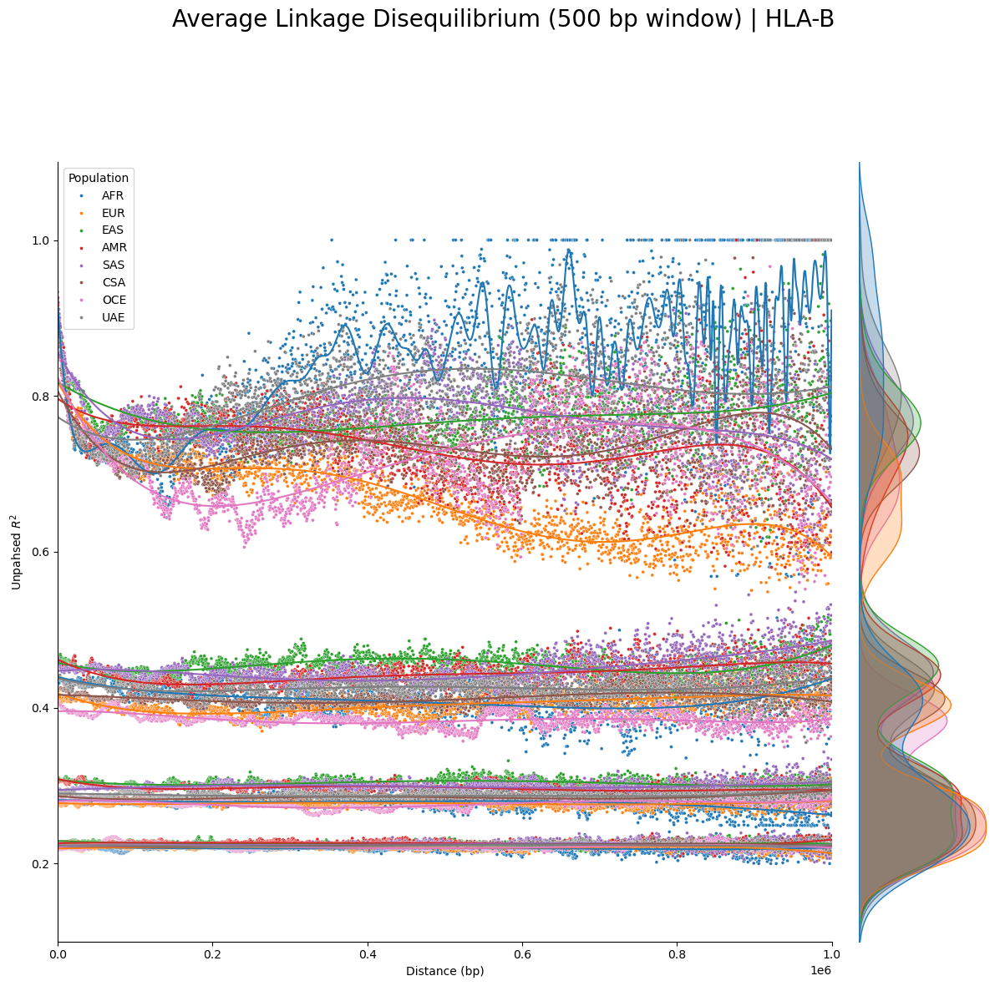

In [17]:
# Make a dictionary of key-value pairs to keep track of all our gene regions
FIGURE = dict()

# For each gene in our list of genes to analyse...
for gene in DATA.keys():
    # Create an empty dict to map populations to color codes
    COLOR_MAP = dict()

    # Generate a list of colors apropriate for use (See Seaborn)
    RAW_COLORS = sns.color_palette(n_colors=len(DATA[gene].keys()))

    # For each populatio in our list of poulations to be commpared
    for index, population in enumerate(DATA[gene].keys()):
        # Store the color code for that population based on list position
        print(gene, population)
        COLOR_MAP[population] = RAW_COLORS[index]

    # Generate a Joint plot illustrating pairwise SNP Linkage Disequilibrium scores ordered by distance for our gene region
    FIGURE[gene] = sns.jointplot(
        PLOT_DATA[gene],
        x="Distance (Binned)",
        y="UNPHASED_R2",
        hue="Population",
        kind="scatter",
        xlim=(0, PLOT_DATA[gene]["Distance (Binned)"].max() + 500),
        ylim=(
            PLOT_DATA[gene]["UNPHASED_R2"].min() - 0.1,
            PLOT_DATA[gene]["UNPHASED_R2"].max() + 0.1,
        ),
        s=8,
        height=12,
        palette=COLOR_MAP,
    )

    # Give the figure a title
    FIGURE[gene].figure.suptitle(
        f"Average Linkage Disequilibrium (500 bp window) | {gene}", fontsize=20,
    )
    FIGURE[gene].ax_marg_y.set_axis_off()
    FIGURE[gene].ax_marg_x.remove()

    # Give the Figure axes apropriate labels
    FIGURE[gene].set_axis_labels(xlabel="Distance (bp)", ylabel="Unpahsed $R^2$")

    # For each population in our list of populations to compare
    for population in POPULATIONS_TO_COMPARE:
        # For each percentile in the available annotated quantiles* 
        # *Quantiles are calculated without overlap, which means in 
        # some cases there may be fewer than 4 groups, to eliminate overlap.
        for percentile in PLOT_DATA[gene]["Quantile"].unique():
            # 
            TMP = PLOT_DATA[gene][
                (PLOT_DATA[gene]["Population"] == population)
                & (PLOT_DATA[gene]["Quantile"] == percentile)
            ]
            FUNCTION_ORDER = 5

            # We can only fit a spline where k > len(x-axis)
            if len(TMP["Distance (Binned)"].tolist()) > FUNCTION_ORDER:
                print(
                    "M > K check: ",
                    len(TMP["Distance (Binned)"].tolist()),
                    FUNCTION_ORDER,
                    len(TMP["Distance (Binned)"].tolist()) > FUNCTION_ORDER,
                )
                t_knots, c_coefficients, degree = splrep(
                    TMP["Distance (Binned)"].tolist(),
                    TMP["UNPHASED_R2"].tolist(),
                    k=FUNCTION_ORDER,
                    s=8
                )

                spline_evaluator = BSpline(t_knots, c_coefficients, degree)
                fitted_y_trendline = spline_evaluator(TMP["Distance"])

                # FIGURE[gene].ax_joint

                sns.lineplot(
                    x=TMP["Distance (Binned)"],
                    y=fitted_y_trendline,
                    ax=FIGURE[gene].ax_joint,
                    legend=False,
                    label=f"{population} | {percentile}",
                    color=COLOR_MAP[population],
                )
            else:
                print(
                    f"Unable to fit a spline.",
                    len(TMP["Distance (Binned)"].tolist()),
                    gene,
                    population,
                    PLOT_DATA[gene].shape[0] >= 4,
                    percentile,
                )


## Trendline
We know from literature, that linkage-decay follows a logorithmic pattern. To properly perform LD-estimation and generate meaningfull LD-Decay trendlines, we have oped to follow a method outlined by [Peter G Vos _et al_](https://doi.org/10.1007/s00122-016-2798-8), which describes the use of spline functions used in data interpolation and smoothing. The authors describe an application of a spline-driven trendline on different quartiles of their analysis data to capture addittional information in a dataset with its own internal layers of context.

> Depending on the ability for Quartile-level spline-driven trendlines to explain the noise in our dataset is in-of itself descriptive to the origin and cause of the noise.

In [18]:
Path(join(path, "Graphs", "06")).mkdir(exist_ok=True, parents=True)

In [19]:
for gene in LOCATIONS["location_name"].unique().tolist():
    FIGURE[gene].figure.savefig(
        join(path, "Graphs", "06", f"Linkage Decay (Binned) {gene}.jpeg"),
        format="jpeg",
        bbox_inches="tight",
    )